# Visualizing and Comparing LIS Output

```{figure} ./images/nasa-lis-combined-logos2.png
---
width: 300px
---
```

## LIS Output Primer

LIS writes model state variables to disk at a frequency selected by the user (e.g., 6-hourly, daily, monthly). The LIS output we will be exploring was originally generated as *daily* NetCDF files, meaning one NetCDF was written per simulated day. We have converted these NetCDF files into a [Zarr](https://zarr.readthedocs.io/en/stable/) store for improved performance in the cloud.

*Data on s3 -> NASA is also starting to leverage cloud-based storage; Zarr: better way to deal with unpractical small netcdf files)

## Import Libraries

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
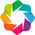

In [1]:
# interface to Amazon S3 filesystem
import s3fs

# interact with n-d arrays
import numpy as np
import xarray as xr

# interact with tabular data (incl. spatial)
import pandas as pd
import geopandas as gpd

# interactive plots
import holoviews as hv
import geoviews as gv
import hvplot.pandas
import hvplot.xarray

# used to find nearest grid cell to a given location
from scipy.spatial import distance

# set bokeh as the holoviews plotting backend
hv.extension('bokeh')

## Load the LIS Output

The `xarray` library makes working with labelled n-dimensional arrays easy and efficient. If you're familiar with the `pandas` library it should feel pretty familiar.

Here we load the LIS output into an `xarray.Dataset` object:

In [2]:
# create S3 filesystem object
s3 = s3fs.S3FileSystem(anon=False)  #reference

# define the name of our S3 bucket
bucket_name = 'eis-dh-hydro/SNOWEX-HACKWEEK'

# define path to store on S3
lis_output_s3_path = f's3://{bucket_name}/DA_SNODAS/SURFACEMODEL/LIS_HIST.d01.zarr/' #funky name from LIS naming scheme

# create key-value mapper for S3 object (required to read data stored on S3)
lis_output_mapper = s3.get_mapper(lis_output_s3_path)  #to use as variable

# open the dataset
lis_output_ds = xr.open_zarr(lis_output_mapper, consolidated=True) #consolidated: to handle metadata file that sits on top of the data

# drop some unneeded variables
lis_output_ds = lis_output_ds.drop_vars(['_history', '_eis_source_path']) 

*If we’re doing this outside of hackweek, do we need different code to read the netcdf files?  Or is it mostly the same? -> yes it's actually pretty similar, check the video*

## Explore the Data

Display an interactive widget for inspecting the dataset by running a cell containing the variable name. Expand the dropdown menus and click on the document and database icons to inspect the variables and attributes.

In [3]:
lis_output_ds

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, east_west: 361, north_south: 215, time: 730)
Coordinates:
  * time              (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
Dimensions without coordinates: SoilMoist_profiles, east_west, north_south
Data variables: (12/26)
    Albedo_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    CanopInt_tavg     (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ECanop_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ESoil_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    GPP_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    LAI_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TVeg_tavg         (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TWS_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lat               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lon               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

*note: 4th dimension only concerns Soil Moisture variable, not all!*

### Accessing Attributes

Dataset attributes (metadata) are accessible via the `attrs` attribute:

In [4]:
lis_output_ds.attrs

{'DX': 0.10000000149011612,
 'DY': 0.10000000149011612,
 'MAP_PROJECTION': 'EQUIDISTANT CYLINDRICAL',
 'NUM_SOIL_LAYERS': 4,
 'SOIL_LAYER_THICKNESSES': [10.0,
  30.000001907348633,
  60.000003814697266,
  100.0],
 'SOUTH_WEST_CORNER_LAT': 28.549999237060547,
 'SOUTH_WEST_CORNER_LON': -113.94999694824219,
 'comment': 'website: http://lis.gsfc.nasa.gov/',
 'conventions': 'CF-1.6',
 'institution': 'NASA GSFC',
 'missing_value': -9999.0,
 'references': 'Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007',
 'source': 'Noah-MP.4.0.1',
 'title': 'LIS land surface model output'}

### Accessing Variables

Variables can be accessed using either **dot notation** or **square bracket notation**:

In [5]:
# dot notation
lis_output_ds.SnowDepth_tavg

<xarray.DataArray 'SnowDepth_tavg' (time: 730, north_south: 215, east_west: 361)>
dask.array<open_dataset-adc145aaabb3f937ea44de06f62d71c3SnowDepth_tavg, shape=(730, 215, 361), dtype=float32, chunksize=(1, 215, 361), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
Dimensions without coordinates: north_south, east_west
Attributes:
    long_name:      snow depth
    standard_name:  snow_depth
    units:          m
    vmax:           999999986991104.0
    vmin:           -999999986991104.0

In [6]:
# square bracket notation -> accesses element in a dictionary
lis_output_ds['SnowDepth_tavg']

<xarray.DataArray 'SnowDepth_tavg' (time: 730, north_south: 215, east_west: 361)>
dask.array<open_dataset-adc145aaabb3f937ea44de06f62d71c3SnowDepth_tavg, shape=(730, 215, 361), dtype=float32, chunksize=(1, 215, 361), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
Dimensions without coordinates: north_south, east_west
Attributes:
    long_name:      snow depth
    standard_name:  snow_depth
    units:          m
    vmax:           999999986991104.0
    vmin:           -999999986991104.0

#### Which syntax should I use?
While both syntaxes perform the same function, the square-bracket syntax is useful when interacting with a dataset programmatically. For example, we can define a variable `varname` that stores the name of the variable in the dataset we want to access and then use that with the square-brackets notation:

In [7]:
varname = 'SnowDepth_tavg'

lis_output_ds[varname]

<xarray.DataArray 'SnowDepth_tavg' (time: 730, north_south: 215, east_west: 361)>
dask.array<open_dataset-adc145aaabb3f937ea44de06f62d71c3SnowDepth_tavg, shape=(730, 215, 361), dtype=float32, chunksize=(1, 215, 361), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
Dimensions without coordinates: north_south, east_west
Attributes:
    long_name:      snow depth
    standard_name:  snow_depth
    units:          m
    vmax:           999999986991104.0
    vmin:           -999999986991104.0

The dot notation syntax will not work this way because `xarray` tries to find a variable in the dataset named `varname` instead of the value of the `varname` variable. When `xarray` can't find this variable, it throws an error:

In [8]:
# uncomment and run the code below to see the error

# varname = 'SnowDepth_tavg'

# lis_output_ds.varname

# says: there's nothing in this dataset

### Dimensions and Coordinate Variables

The dimensions and coordinate variable fields put the "*labelled*" in "labelled n-dimensional arrays":

* **Dimensions:** labels for each dimension in the dataset (e.g., `time`)
* **Coordinates:** labels for indexing along dimensions (e.g., `'2019-01-01'`)

We can use these labels to select, slice, and aggregate the dataset.

#### Selecting/Subsetting

`xarray` provides two methods for selecting or subsetting along coordinate variables:

* index selection: `ds.isel(time=0)`
* value selection `ds.sel(time='2019-01-01')`

For example, we can select the first timestep from our dataset using index selection by passing the dimension name as a keyword argument:

In [9]:
# remember: python indexes start at 0
lis_output_ds.isel(time=0)

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, east_west: 361, north_south: 215)
Coordinates:
    time              datetime64[ns] 2016-10-01
Dimensions without coordinates: SoilMoist_profiles, east_west, north_south
Data variables: (12/26)
    Albedo_tavg       (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    CanopInt_tavg     (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ECanop_tavg       (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ESoil_tavg        (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    GPP_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    LAI_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TVeg_tavg         (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TWS_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    lat               (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    lon               (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

Or we can use value selection to select based on the coordinate(s) (think "labels") of a given dimension:

In [10]:
lis_output_ds.sel(time='2018-01-01')

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, east_west: 361, north_south: 215)
Coordinates:
    time              datetime64[ns] 2018-01-01
Dimensions without coordinates: SoilMoist_profiles, east_west, north_south
Data variables: (12/26)
    Albedo_tavg       (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    CanopInt_tavg     (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ECanop_tavg       (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ESoil_tavg        (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    GPP_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    LAI_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TVeg_tavg         (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TWS_tavg          (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    lat               (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
    lon               (north_south, east_west) float32 dask.array<chunksize=(215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

The `.sel()` approach also allows the use of shortcuts in some cases. For example, here we select all timesteps in the month of January 2018:

In [11]:
lis_output_ds.sel(time='2018-01')

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, east_west: 361, north_south: 215, time: 31)
Coordinates:
  * time              (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2018-01-31
Dimensions without coordinates: SoilMoist_profiles, east_west, north_south
Data variables: (12/26)
    Albedo_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    CanopInt_tavg     (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ECanop_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ESoil_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    GPP_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    LAI_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TVeg_tavg         (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TWS_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lat               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lon               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

Select a custom range of dates using Python's built-in `slice()` method:

In [12]:
lis_output_ds.sel(time=slice('2018-01-01', '2018-01-15'))

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, east_west: 361, north_south: 215, time: 15)
Coordinates:
  * time              (time) datetime64[ns] 2018-01-01 2018-01-02 ... 2018-01-15
Dimensions without coordinates: SoilMoist_profiles, east_west, north_south
Data variables: (12/26)
    Albedo_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    CanopInt_tavg     (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ECanop_tavg       (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ESoil_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    GPP_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    LAI_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TVeg_tavg         (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TWS_tavg          (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lat               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    lon               (time, north_south, east_west) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

#### Latitude and Longitude

You may have noticed that latitude (`lat`) and longitude (`lon`) are listed as data variables, not coordinate variables. This dataset would be easier to work with if `lat` and `lon` were coordinate variables and dimensions. Here we define a helper function that reads the spatial information from the dataset attributes, generates arrays containing the `lat` and `lon` values, and appends them to the dataset:

In [13]:
def add_latlon_coords(dataset: xr.Dataset)->xr.Dataset: # function expects xr.Dataset to come in and will throw one out, error if other datatype comes in! Python 3 thing
    """Adds lat/lon as dimensions and coordinates to an xarray.Dataset object."""
    
    # get attributes from dataset
    attrs = dataset.attrs
    
    # get x, y resolutions
    dx = round(float(attrs['DX']), 3)
    dy = round(float(attrs['DY']), 3)
    
    # get grid cells in x, y dimensions
    ew_len = len(dataset['east_west'])
    ns_len = len(dataset['north_south'])
    
    # get lower-left lat and lon
    ll_lat = round(float(attrs['SOUTH_WEST_CORNER_LAT']), 3)
    ll_lon = round(float(attrs['SOUTH_WEST_CORNER_LON']), 3)
    
    # calculate upper-right lat and lon
    ur_lat =  ll_lat + (dy * ns_len)
    ur_lon = ll_lon + (dx * ew_len)
    
    # define the new coordinates
    coords = {
        # create an arrays containing the lat/lon at each gridcell
        'lat': np.linspace(ll_lat, ur_lat, ns_len, dtype=np.float32, endpoint=False),
        'lon': np.linspace(ll_lon, ur_lon, ew_len, dtype=np.float32, endpoint=False)
    }
    
    lon_attrs = dataset.lon.attrs
    lat_attrs = dataset.lat.attrs
    
    # rename the original lat and lon variables
    dataset = dataset.rename({'lon':'orig_lon', 'lat':'orig_lat'})
    # rename the grid dimensions to lat and lon
    dataset = dataset.rename({'north_south': 'lat', 'east_west': 'lon'})
    # assign the coords above as coordinates
    dataset = dataset.assign_coords(coords)
    dataset.lon.attrs = lon_attrs
    dataset.lat.attrs = lat_attrs
    
    return dataset

Now that the function is defined, let's use it to append `lat` and `lon` coordinates to the LIS output:

In [14]:
lis_output_ds = add_latlon_coords(lis_output_ds)

Inspect the dataset:

In [15]:
lis_output_ds

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, lat: 215, lon: 361, time: 730)
Coordinates:
  * time              (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
  * lat               (lat) float32 28.55 28.65 28.75 ... 49.75 49.85 49.95
  * lon               (lon) float32 -113.9 -113.8 -113.8 ... -78.05 -77.95
Dimensions without coordinates: SoilMoist_profiles
Data variables: (12/26)
    Albedo_tavg       (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    CanopInt_tavg     (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ECanop_tavg       (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ESoil_tavg        (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    GPP_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    LAI_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TVeg_tavg         (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TWS_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    TotalPrecip_tavg  (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    orig_lat          (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
    orig_lon          (time, lat, lon) float32 dask.array<chunksize=(1, 215, 361), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

Now `lat` and `lon` are listed as coordinate variables and have replaced the `north_south` and `east_west` dimensions. This will make it easier to spatially subset the dataset!

#### Basic Spatial Subsetting

We can use the `slice()` function we used above on the `lat` and `lon` dimensions to select data between a range of latitudes and longitudes:

In [16]:
lis_output_ds.sel(lat=slice(37, 41), lon=slice(-110, -101))

<xarray.Dataset>
Dimensions:           (SoilMoist_profiles: 4, lat: 40, lon: 90, time: 730)
Coordinates:
  * time              (time) datetime64[ns] 2016-10-01 2016-10-02 ... 2018-09-30
  * lat               (lat) float32 37.05 37.15 37.25 ... 40.75 40.85 40.95
  * lon               (lon) float32 -109.9 -109.8 -109.8 ... -101.2 -101.1
Dimensions without coordinates: SoilMoist_profiles
Data variables: (12/26)
    Albedo_tavg       (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    CanopInt_tavg     (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    ECanop_tavg       (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    ESoil_tavg        (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    GPP_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    LAI_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    ...                ...
    Swnet_tavg        (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    TVeg_tavg         (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    TWS_tavg          (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    TotalPrecip_tavg  (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    orig_lat          (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
    orig_lon          (time, lat, lon) float32 dask.array<chunksize=(1, 40, 90), meta=np.ndarray>
Attributes: (12/14)
    DX:                      0.10000000149011612
    DY:                      0.10000000149011612
    MAP_PROJECTION:          EQUIDISTANT CYLINDRICAL
    NUM_SOIL_LAYERS:         4
    SOIL_LAYER_THICKNESSES:  [10.0, 30.000001907348633, 60.000003814697266, 1...
    SOUTH_WEST_CORNER_LAT:   28.549999237060547
    ...                      ...
    conventions:             CF-1.6
    institution:             NASA GSFC
    missing_value:           -9999.0
    references:              Kumar_etal_EMS_2006, Peters-Lidard_etal_ISSE_2007
    source:                  Noah-MP.4.0.1
    title:                   LIS land surface model output

Notice how the sizes of the `lat` and `lon` dimensions have decreased.

#### Subset Across Multiple Dimensions

Select snow depth for Jan 2017 within a range of lat/lon:

In [17]:
# define a range of dates to select
wy_2018_slice = slice('2017-10-01', '2018-09-30')
lat_slice = slice(37, 41)
lon_slice = slice(-109, -102)

# select the snow depth and subset to wy_2018_slice
snd_CO_wy2018_ds = lis_output_ds['SnowDepth_tavg'].sel(time=wy_2018_slice, lat=lat_slice, lon=lon_slice)

# inspect resulting dataset
snd_CO_wy2018_ds

<xarray.DataArray 'SnowDepth_tavg' (time: 365, lat: 40, lon: 70)>
dask.array<getitem, shape=(365, 40, 70), dtype=float32, chunksize=(1, 40, 70), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2017-10-01 2017-10-02 ... 2018-09-30
  * lat      (lat) float32 37.05 37.15 37.25 37.35 ... 40.65 40.75 40.85 40.95
  * lon      (lon) float32 -108.9 -108.8 -108.8 -108.7 ... -102.2 -102.2 -102.1
Attributes:
    long_name:      snow depth
    standard_name:  snow_depth
    units:          m
    vmax:           999999986991104.0
    vmin:           -999999986991104.0

*heads up, there is a difference between a DataSet and a DataArray --> DataSet is built of DataArrays*

### Plotting

We've imported two plotting libraries:

* `matplotlib`: static plots
* `hvplot`: interactive plots

We can make a quick `matplotlib`-based plot for the subsetted data using the `.plot()` function supplied by `xarray.Dataset` objects. For this example, we'll select one day and plot it:

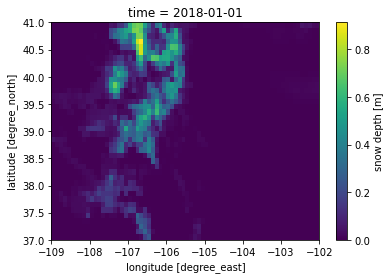

In [18]:
# simple matplotlilb plot -> select a specific time step to handle this
snd_CO_wy2018_ds.sel(time='2018-01-01').plot()

Similarly we can make an interactive plot using the `hvplot` accessor and specifying a `quadmesh` plot type:

In [19]:
# hvplot based map
snd_CO_20180101_plot = snd_CO_wy2018_ds.sel(time='2018-01-01').hvplot.quadmesh(geo=True, rasterize=True, project=True,
                                                                               xlabel='lon', ylabel='lat', cmap='viridis',
                                                                               tiles='EsriImagery')

snd_CO_20180101_plot

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [lon,lat]   (SnowDepth_tavg)

Pan, zoom, and scroll around the map. Hover over the LIS data to see the data values.

If we try to plot more than one time-step `hvplot` will also provide a time-slider we can use to scrub back and forth in time:

In [20]:
snd_CO_wy2018_ds.sel(time='2018-01').hvplot.quadmesh(geo=True, rasterize=True, project=True,
                             xlabel='lon', ylabel='lat', cmap='viridis',
                             tiles='EsriImagery')

:DynamicMap   [time]
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [lon,lat]   (SnowDepth_tavg)

From here on out we will stick with `hvplot` for plotting. *coooool!*

#### Timeseries Plots

We can generate a timeseries for a given grid cell by selecting and calling the plot function:

In [21]:
# define point to take timeseries (note: must be present in coordinates of dataset)
ts_lon, ts_lat = (-105.65, 40.35)

# plot timeseries (hvplot knows how to plot based on dataset's dimensionality!)
snd_CO_wy2018_ds.sel(lat=ts_lat, lon=ts_lon).hvplot(title=f'Snow Depth Timeseries @ Lon: {ts_lon}, Lat: {ts_lat}',
                                                   xlabel='Date', ylabel='Snow Depth (m)') + \
    snd_CO_20180101_plot * gv.Points([(ts_lon, ts_lat)]).opts(size=10, color='red')
    


:Layout
   .Curve.I      :Curve   [time]   (SnowDepth_tavg)
   .DynamicMap.I :DynamicMap   []
      :Overlay
         .Tiles.I  :Tiles   [x,y]
         .Image.I  :Image   [lon,lat]   (SnowDepth_tavg)
         .Points.I :Points   [x,y]

In the next section we'll learn how to create a timeseries over a broader area.

## Aggregation

We can perform aggregation operations on the dataset such as `min()`, `max()`, `mean()`, and `sum()` by specifying the dimensions along which to perform the calculation.

For example we can calculate the mean and maximum snow depth at each grid cell over water year 2018 as follows:

In [22]:
# calculate the mean at each grid cell over the time dimension
mean_snd_CO_wy2018_ds = snd_CO_wy2018_ds.mean(dim='time')
max_snd_CO_wy2018_ds = snd_CO_wy2018_ds.max(dim='time')

# plot the mean and max snow depth
mean_snd_CO_wy2018_ds.hvplot.quadmesh(geo=True, rasterize=True, project=True,
                                   xlabel='lon', ylabel='lat', cmap='viridis',
                                   tiles='EsriImagery', title='Mean Snow Depth - WY2018') + \
    max_snd_CO_wy2018_ds.hvplot.quadmesh(geo=True, rasterize=True, project=True,
                                   xlabel='lon', ylabel='lat', cmap='viridis',
                                   tiles='EsriImagery', title='Max Snow Depth - WY2018')

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Overlay
         .Tiles.I :Tiles   [x,y]
         .Image.I :Image   [lon,lat]   (SnowDepth_tavg)
   .DynamicMap.II :DynamicMap   []
      :Overlay
         .Tiles.I :Tiles   [x,y]
         .Image.I :Image   [lon,lat]   (SnowDepth_tavg)

### Area Average

In [23]:
# take area-averaged mean at each timestep
mean_snd_CO_wy2018_ds = snd_CO_wy2018_ds.mean(['lat', 'lon'])

# inspect the dataset
mean_snd_CO_wy2018_ds

<xarray.DataArray 'SnowDepth_tavg' (time: 365)>
dask.array<mean_agg-aggregate, shape=(365,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2017-10-01 2017-10-02 ... 2018-09-30

In [24]:
# plot timeseries (hvplot knows how to plot based on dataset's dimensionality!)
mean_snd_CO_wy2018_ds.hvplot(title='Mean LIS Snow Depth for Colorado', xlabel='Date', ylabel='Snow Depth (m)')

:Curve   [time]   (SnowDepth_tavg)

## Comparing LIS Output

Now that we're familiar with the LIS output, let's compare it to two other datasets: SNODAS (raster) and SNOTEL (point).

### LIS (raster) vs. SNODAS (raster)

First, we'll load the SNODAS dataset which we also have hosted on S3 as a Zarr store: *same process as for LIS data condensed to 1 line*

In [25]:
# load SNODAS dataset

#snodas depth
key = "SNODAS/snodas_snowdepth_20161001_20200930.zarr"    
snodas_depth_ds = xr.open_zarr(s3.get_mapper(f"{bucket_name}/{key}"), consolidated=True)

# apply scale factor to convert to meters (0.001 per SNODAS user guide)
snodas_depth_ds = snodas_depth_ds * 0.001

Next we define a helper function to extract the (lon, lat) of the nearest grid cell to a given point:

In [26]:
def nearest_grid(ds, pt):
    
    """
    Returns the nearest lon and lat to pt in a given Dataset (ds).
    
    pt : input point, tuple (longitude, latitude)
    output:
        lon, lat
    """
    
    if all(coord in list(ds.coords) for coord in ['lat', 'lon']):
        df_loc = ds[['lon', 'lat']].to_dataframe().reset_index()
    else:
        df_loc = ds[['orig_lon', 'orig_lat']].isel(time=0).to_dataframe().reset_index()
    
    loc_valid = df_loc.dropna()
    pts = loc_valid[['lon', 'lat']].to_numpy()
    idx = distance.cdist([pt], pts).argmin()
    
    return loc_valid['lon'].iloc[idx], loc_valid['lat'].iloc[idx]

The next cell will look pretty similar to what we did earlier to plot a timeseries of a single point in the LIS data. The general steps are:

* Extract the coordinates of the SNODAS grid cell nearest to our LIS grid cell (`ts_lon` and `ts_lat` from earlier)
* Subset the SNODAS and LIS data to the grid cells and date ranges of interest
* Create the plots!

In [27]:
# get lon, lat of snodas grid cell nearest to the LIS coordinates we used earlier
snodas_ts_lon, snodas_ts_lat = nearest_grid(snodas_depth_ds, (ts_lon, ts_lat))

# define a date range to plot (shorter = quicker for demo)
start_date, end_date = ('2018-01-01', '2018-03-01')
plot_daterange = slice(start_date, end_date)

# select SNODAS grid cell and subset to plot_daterange
snodas_snd_subset_ds = snodas_depth_ds.sel(lon=snodas_ts_lon,
                                             lat=snodas_ts_lat,
                                             time=plot_daterange)

# select LIS grid cell and subset to plot_daterange
lis_snd_subset_ds = lis_output_ds['SnowDepth_tavg'].sel(lat=ts_lat,
                                                        lon=ts_lon,
                                                        time=plot_daterange)

# create SNODAS snow depth plot
snodas_snd_plot = snodas_snd_subset_ds.hvplot(label='SNODAS')

# create LIS snow depth plot
lis_snd_plot = lis_snd_subset_ds.hvplot(label='LIS')

# create SNODAS vs LIS snow depth plot
lis_vs_snodas_snd_plot = (lis_snd_plot * snodas_snd_plot)

# display the plot
lis_vs_snodas_snd_plot.opts(title=f'Snow Depth @ Lon: {ts_lon}, Lat: {ts_lat}',
                            legend_position='right',
                            xlabel='Date',
                            ylabel='Snow Depth (m)')

:Overlay
   .Curve.LIS    :Curve   [time]   (SnowDepth_tavg)
   .Curve.SNODAS :Curve   [time]   (SNOWDEPTH)

### LIS (raster) vs. SNODAS (raster) vs. SNOTEL (point)

Now let's add SNOTEL point data to our plot.

First, we're going to define some helper functions to load the SNOTEL data:

In [28]:
# load csv containing metadata for SNOTEL sites in a given state (e.g,. 'colorado')
def load_site(state):
    
    # define the path to the file
    key = f"SNOTEL/snotel_{state}.csv"
    
    # load the csv into a pandas DataFrame
    df = pd.read_csv(s3.open(f's3://{bucket_name}/{key}', mode='r'))
    
    return df

# load SNOTEL data for a specific site
def load_snotel_txt(state, var):
    
    # define the path to the file
    key = f"SNOTEL/snotel_{state}{var}_20162020.txt"
    
    # determine how many lines to skip in the file (they start with #)
    fh = s3.open(f"{bucket_name}/{key}")
    lines = fh.readlines()
    skips = sum(1 for ln in lines if ln.decode('ascii').startswith('#'))
    
    # load the data into a pandas DataFrame
    df = pd.read_csv(s3.open(f"s3://{bucket_name}/{key}"), skiprows=skips)
    
    # convert the Date column from strings to datetime objects
    df['Date'] = pd.to_datetime(df['Date'])
    return df

For the purposes of this tutorial let's load the SNOTEL data for sites in Colorado. We'll pick one site to plot in a few cells.

In [29]:
# load SNOTEL snow depth for Colorado into a dictionary
snotel_depth = {'CO': load_snotel_txt('CO', 'depth')}

We'll need another helper function to load the depth data:

In [30]:
# get snotel depth
def get_depth(state, site, start_date, end_date):
    
    # grab the depth for the given state (e.g., CO)
    df = snotel_depth[state]
    
    # define a date range mask
    mask = (df['Date'] >= start_date) & (df['Date'] <= end_date)
    
    # use mask to subset between time range
    df = df.loc[mask]
    
    # extract timeseries for the given site
    return pd.concat([df.Date, df.filter(like=site)], axis=1).set_index('Date')

Load the site metadata for Colorado:

In [31]:
co_sites = load_site('colorado')

# peek at the first 5 rows
co_sites.head()

,ntwk,state,site_name,ts,lat,lon,elev
0,SNTL,CO,Apishapa (303),NaN,37.33,-105.07,10000
1,SNTL,CO,Arapaho Ridge (1030),NaN,40.35,-106.35,10960
2,SNTL,CO,Bear Lake (322),NaN,40.31,-105.65,9500
3,SNTL,CO,Bear River (1061),NaN,40.06,-107.01,9080
4,SNTL,CO,Beartown (327),NaN,37.71,-107.51,11600


The point we've been using so far in the tutorial actually corresponds to the coordinates for the Bear Lake SNOTEL site along the Front Range! Let's extract the site data for that point:

In [ ]:
# get the depth data by passing the site name to the get_depth() function
bear_lake_snd_df = get_depth('CO', 'Bear Lake (322)', start_date, end_date)

# convert from cm to m
bear_lake_snd_df = bear_lake_snd_df / 100

Now we're ready to plot:

In [ ]:
# create SNOTEL plot
bear_lake_plot = bear_lake_snd_df.hvplot(label='SNOTEL')

# combine the SNOTEl plot with the LIS vs SNODAS plot
(bear_lake_plot * lis_vs_snodas_snd_plot).opts(title=f'Snow Depth @ Lon: {ts_lon}, Lat: {ts_lat}', legend_position='right')

# Conclusion

You should now be more familiar with LIS data and how to interact with it in Python. The code in this notebook is a great jumping off point for developing more advanced comparisons and interactive widgets. For an example of what is possible, open the next notebook and run all the cells (Run > Run All Cells). After a few minutes, two interactive widgets will appear that allow you to explore and compare LIS output with SNODAS and SNOTEL data.

The Python code can be adapted to other LIS simulations and to other model output as well, with minor modifications. Anyone interested in testing your new skills can combine what you learned here with the other SnowEx Hackweek tutorials - try comparing the LIS output with other snow observations collected during the 2017 field campaign!